<a href="https://colab.research.google.com/github/akashe/UnsupervisedLearning/blob/master/GANs/Condtional_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Previosuly, we implemented a [DCGAN](https://github.com/akashe/UnsupervisedLearning/blob/master/GANs/DCGAN.ipynb). Two important things from that experiment:

1. It works on smaller image sizes.
2. We have no control over the type of image the generator models.

The idea behind Condtional GANs is to have some control over the kind of images generator creates. The only difference in Conditinal Gans from original GANs is that both Generator and Discriminator have class information in them. A good way to include class information is to use an Embedding layer to map the class information to the image size and add this as channel for dicriminator and generator.

We will implement a Conditional-DCGAN here.

Observations:

1. in the first try, I didn't really get truck photos. It was something like mode collapse where generator was just creating mixed images.
2. Discriminator loss didn't decrease well in 10 epochs. In 30 epochs however there was slight decrease.
3. In discriminator there is transformation from 1 value to 1024. Added Sequential of multiple linear transform with dropout so that discriminator can have more information from labels. Similar results here also. Discriminator loss not decreasing. 

In [1]:
# import stuff
import torch
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import random
import torchvision.datasets as datasets
import torchvision.transforms as transforms

In [2]:
# Set Seed
SEED = 1080
random.seed(SEED)
torch.manual_seed(SEED)

We will work on CIFAR since it has labels. Other options were MNIST or Fashion MNIST, but I am interested in trying out CIFAR because it would be tougher.

In [3]:
# Download Dataset
dataset = datasets.CIFAR10(root="/content/CIFAR10",train=True,download=True,transform=transforms.ToTensor())

Files already downloaded and verified


In [4]:
len(dataset)

50000

In [5]:
dataset[0][0].shape,dataset[1][1]

(torch.Size([3, 32, 32]), 9)

In [6]:
import numpy as np
import torchvision.utils as vutils

def display_image(img):
  plt.figure(figsize=(1,1))
  npimg = img.numpy()
  plt.imshow(np.transpose(npimg,(1,2,0)),interpolation='nearest')

def display_batch(batch):
  plt.figure(figsize=(8,8))
  plt.axis('off')
  plt.title('sample_batch')
  plt.imshow(np.transpose(vutils.make_grid(batch[0].to(device),padding=2,normalize=True,nrow=20,scale_each=True).cpu(),(1,2,0)))

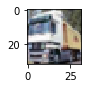

In [7]:
display_image(dataset[1][0])

In [8]:
dataset[1][1]

9

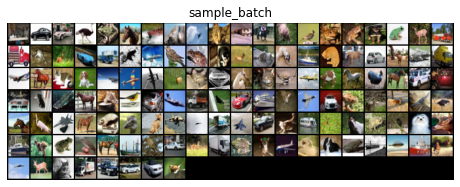

In [9]:
# create dataloader
batch_size = 128

dataloader = torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# device = 'cpu'

test_batch = next(iter(dataloader))

display_batch(test_batch)


In [10]:
# Defining Generator  
class Generator(nn.Module):
  def __init__(self,class_labels=10,latent_vector_size=50,label_embedding_size=20,output_dim=32,out_channels=3):
    super().__init__()
    self.latent_vector_size = latent_vector_size
    self.label_embedding_size = label_embedding_size
    self.embbed_label = nn.Embedding(class_labels,label_embedding_size)
    self.network = nn.Sequential(
        # input size - [N,50+20,1,1]-> [N,512,4,4]
        nn.ConvTranspose2d(latent_vector_size+20,512,4,1,0,bias= False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),
        # input_size: [N,512,4,4] -> [N,256,8,8]
        nn.ConvTranspose2d(512,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),
        # input_size: [N,256,8,8]-> [N,128,16,16]
        nn.ConvTranspose2d(256,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),
        # input_size: [N,128,16,16] -> [N,3,32,32]
        nn.ConvTranspose2d(128,3,4,2,1,bias=False),
        nn.Tanh()
    )
  def forward(self,input,label):
    # input:[N,latent_vector_size,1,1] ,label : [N]
    embedded_label = self.embbed_label(label)
    # embedded_label : [N,label_embedding_size]
    embedded_label = embedded_label.unsqueeze(-1).unsqueeze(-1)
    # embedded_label : [N,label_embedding_size,1,1]

    label_plus_latent = torch.cat([input,embedded_label],dim=1)
    assert label_plus_latent.shape[1] == (self.latent_vector_size+self.label_embedding_size)

    return self.network(label_plus_latent)

In [11]:
class Discriminator(nn.Module):
  def __init__(self,class_labels=10,in_channels=3,out_channels=1,img_size=32):
    super().__init__()
    self.img_size = img_size
    self.in_channels = in_channels
    self.embbed_latent = nn.Embedding(class_labels,img_size)
    self.enhance_linear = nn.Sequential( 
    nn.Linear(img_size,10*img_size),
    nn.Dropout(0.5),
    nn.Linear(10*img_size,img_size*img_size),
    nn.Dropout(0.5)
    )
    self.network = nn.Sequential(
        # Input: Input+label_embedding : [N,4,32,32] -> [N,64,16,16]
        nn.Conv2d((in_channels+1),64,4,2,1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),
        # Input: [N,64,16,16] -> [N,128,8,8]
        nn.Conv2d(64,128,4,2,1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),
        #input: [N,128,8,8] -> [N,256,4,4]
        nn.Conv2d(128,256,4,2,1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),
        # input: [N,256,4,4] -> [N,1,1,1]
        nn.Conv2d(256,1,4,1,0,bias=False),
        nn.Sigmoid()
    )
  def forward(self,input,label):
    # input: [N,3,32,32] ,label: [N]
    embedded_latent = self.embbed_latent(label)
    # embedded_latent : [N,32]
    embedded_latent = self.enhance_linear(embedded_latent)
    # embedded_latent : [N,32*32]
    embedded_latent = embedded_latent.reshape(-1,self.img_size,self.img_size).unsqueeze(1)
    # embedded_latent : [N,1,32,32]
    label_plus_latent = torch.cat([input,embedded_latent],dim=1).to(device)
    assert label_plus_latent.shape[1] == (self.in_channels+1)
    # label_plus_latent : [N,4,32,32]

    return self.network(label_plus_latent)

In [12]:
# Initialize Weight
def init_weights(m):
  classname = m.__class__.__name__
  if classname.find('Conv')!= -1:
    nn.init.normal_(m.weight.data,0.0,0.02)
  elif classname.find('BatchNorm')!= -1:
    nn.init.normal_(m.weight.data,1.0,0.02)
    nn.init.constant_(m.bias.data,0)

In [13]:
latent_vector_size = 50
lr = 0.0002
beta1 = 0.5

# loss criterion
criterion = nn.BCELoss()

# Defining labels
real_label = 1.
fake_label = 0.

# Create inputs to check progress of Generator
progress_latent_vector = torch.randn([batch_size,latent_vector_size,1,1],device=device)
progress_class_label = torch.ones(batch_size,device=device,dtype=torch.int64).fill_(9) # We will see evolution of Trucks :D

# Defining models
D = Discriminator().to(device)
D.apply(init_weights)

G = Generator().to(device)
G.apply(init_weights)

# Optimizers
G_optim = optim.Adam(G.parameters(),lr= lr,betas=(beta1,0.999))
D_optim = optim.Adam(D.parameters(),lr=lr,betas=(beta1,0.999))

In [15]:
# Training Loop
num_epochs = 30

img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in range(num_epochs):
  for i,batch in enumerate(dataloader):

    # Training discriminator

    # checking real images
    D_optim.zero_grad() # Deliberately choosing to set model
    real_images= batch[0].to(device)
    batch_size = real_images.shape[0]
    batch_real_labels= batch[1].to(device)
    batch_real_labels.requires_grad = False
    real_predictions = D(real_images,batch_real_labels).view(-1)

    labels = torch.ones(batch_size,requires_grad=False).to(device)

    Dloss_real = criterion(real_predictions,labels)

    Dloss_real.backward() # loss from real images
    D_x = real_predictions.mean().item()

    # checking fake images
    latent_vector = torch.randn(batch_size,latent_vector_size,1,1).to(device)

    # Should I create random iamge labels and then give them to discriminator? What difference wud it make?
    fake_images = G(latent_vector,batch_real_labels)

    labels.fill_(fake_label)

    fake_predictions = D(fake_images.detach(),batch_real_labels).view(-1)

    Dloss_fake = criterion(fake_predictions,labels)

    Dloss_fake.backward()

    D_G_z1 = fake_predictions.mean().item()

    total_D_error = Dloss_real + Dloss_fake

    D_optim.step()


    # Training Generator

    G_optim.zero_grad()

    labels.fill_(real_label)

    fake_predictions = D(fake_images,batch_real_labels).view(-1)

    Gloss = criterion(fake_predictions,labels)

    Gloss.backward()

    D_G_z2 = fake_predictions.mean().item()

    G_optim.step()

    # Printing losses and saving results for later

    if i%50 == 0:
      print(f'[{epoch}/{num_epochs}] [{i}/{len(dataloader)}] \t Loss D:{total_D_error.item():.4f} \t Loss G:{Gloss.item():.4f}\
       \t D(x,y):{D_G_z1:.4f} \t D(G(x,y),y):{D_G_z2:.4f}')
    
    G_losses.append(Gloss.item())
    D_losses.append(total_D_error.item())

    if (iters%300 == 0) or ((epoch==num_epochs-1) and (i==len(dataloader)-1)):
      with torch.no_grad():
        fake= G(progress_latent_vector,progress_class_label).detach().cpu()
      img_list.append(vutils.make_grid(fake,padding=2,normalize=True,nrow=15,scale_each=True))
    iters += 1

[0/30] [0/391] 	 Loss D:1.0776 	 Loss G:1.4696       	 D(x,y):0.4525 	 D(G(x,y),y):0.2498
[0/30] [50/391] 	 Loss D:1.3431 	 Loss G:1.7641       	 D(x,y):0.5201 	 D(G(x,y),y):0.1871
[0/30] [100/391] 	 Loss D:1.2560 	 Loss G:1.2446       	 D(x,y):0.4622 	 D(G(x,y),y):0.3146
[0/30] [150/391] 	 Loss D:1.0692 	 Loss G:1.0343       	 D(x,y):0.3186 	 D(G(x,y),y):0.3758
[0/30] [200/391] 	 Loss D:1.5623 	 Loss G:0.9637       	 D(x,y):0.4694 	 D(G(x,y),y):0.4000
[0/30] [250/391] 	 Loss D:1.2680 	 Loss G:1.4464       	 D(x,y):0.4060 	 D(G(x,y),y):0.2584
[0/30] [300/391] 	 Loss D:1.3948 	 Loss G:1.2904       	 D(x,y):0.4645 	 D(G(x,y),y):0.2983
[0/30] [350/391] 	 Loss D:1.1720 	 Loss G:1.3576       	 D(x,y):0.4697 	 D(G(x,y),y):0.2785
[1/30] [0/391] 	 Loss D:0.9593 	 Loss G:1.4363       	 D(x,y):0.4236 	 D(G(x,y),y):0.2650
[1/30] [50/391] 	 Loss D:1.1240 	 Loss G:0.8963       	 D(x,y):0.2868 	 D(G(x,y),y):0.4254
[1/30] [100/391] 	 Loss D:1.0931 	 Loss G:1.4640       	 D(x,y):0.4661 	 D(G(x,y),y):0

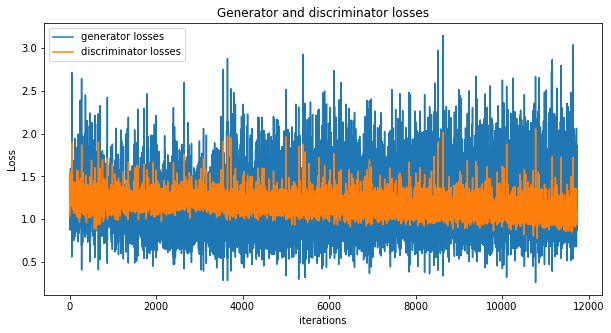

In [16]:
# Plotting discriminator and generator losses
plt.figure(figsize=(10,5))
plt.title("Generator and discriminator losses")
plt.plot(G_losses,label="generator losses")
plt.plot(D_losses,label="discriminator losses")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

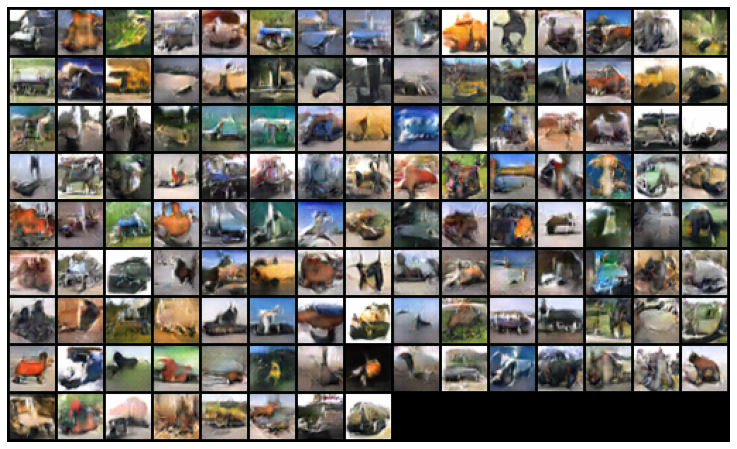

In [21]:
# Evolution of generator while predicting trucks
from IPython.display import HTML
import matplotlib
import matplotlib.animation as animation
matplotlib.rcParams['animation.embed_limit']=2**64
fig = plt.figure(figsize=(16,8))
plt.axis("off")
ims=[[plt.imshow(np.transpose(i,(1,2,0)),animated=True)] for i in img_list[30:]]
ani = animation.ArtistAnimation(fig,ims,interval=1000,repeat_delay=1000,blit=True)

HTML(ani.to_jshtml())